## Problem
> Identify type of butterfly given a photo of butterfly

## Data
> Dataset is from kaggle
https://www.kaggle.com/datasets/veeralakrishna/butterfly-dataset

## Evaluation
> Evaluation will be done by CategoricalCrossentropy()

## Features
> We are dealing with unstructured data so we will use deep learning or transfer learning

> we have a total of 6000+ images on the training and validation dataset

> we have 75 unique labels



## 1. EDA (Exploratory Data Analysis)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !unzip '/content/drive/MyDrive/Butterfly-dataset-kaggle/archive (7).zip' -d 'drive/MyDrive/Butterfly-dataset-kaggle'

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from IPython.display import Image

In [ ]:
butterfly_train = os.listdir('/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/train')
butterfly_train[:4], len(butterfly_train)

(['Image_6038.jpg', 'Image_728.jpg', 'Image_592.jpg', 'Image_6212.jpg'], 6499)

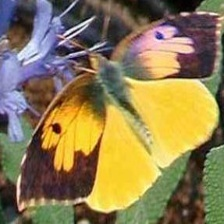

In [ ]:
Image('/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/train/Image_2050.jpg')

In [ ]:
train_csv = pd.read_csv('/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/Training_set.csv')
train_csv[:20]

,filename,label
0,Image_1.jpg,SOUTHERN DOGFACE
1,Image_2.jpg,ADONIS
2,Image_3.jpg,BROWN SIPROETA
3,Image_4.jpg,MONARCH
4,Image_5.jpg,GREEN CELLED CATTLEHEART
5,Image_6.jpg,CAIRNS BIRDWING
6,Image_7.jpg,GREEN CELLED CATTLEHEART
7,Image_8.jpg,EASTERN DAPPLE WHITE
8,Image_9.jpg,BROWN SIPROETA
9,Image_10.jpg,RED POSTMAN


In [ ]:
train_csv['label'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 6499 entries, 0 to 6498
Series name: label
Non-Null Count  Dtype 
--------------  ----- 
6499 non-null   object
dtypes: object(1)
memory usage: 50.9+ KB


In [ ]:
train_csv.isna().sum()

filename    0
label       0
dtype: int64

In [ ]:
train_csv['label'].value_counts()

MOURNING CLOAK    131
SLEEPY ORANGE     107
ATALA             100
BROWN SIPROETA     99
CRECENT            97
                 ... 
AMERICAN SNOOT     74
GOLD BANDED        73
MALACHITE          73
CRIMSON PATCH      72
WOOD SATYR         71
Name: label, Length: 75, dtype: int64

In [ ]:
train_csv.columns

Index(['filename', 'label'], dtype='object')

In [ ]:
train_csv.dtypes

filename    object
label       object
dtype: object

In [ ]:
len(train_csv['label'].value_counts())

75

In [ ]:
np.unique(train_csv['label'])

array(['ADONIS', 'AFRICAN GIANT SWALLOWTAIL', 'AMERICAN SNOOT', 'AN 88',
       'APPOLLO', 'ATALA', 'BANDED ORANGE HELICONIAN', 'BANDED PEACOCK',
       'BECKERS WHITE', 'BLACK HAIRSTREAK', 'BLUE MORPHO',
       'BLUE SPOTTED CROW', 'BROWN SIPROETA', 'CABBAGE WHITE',
       'CAIRNS BIRDWING', 'CHECQUERED SKIPPER', 'CHESTNUT', 'CLEOPATRA',
       'CLODIUS PARNASSIAN', 'CLOUDED SULPHUR', 'COMMON BANDED AWL',
       'COMMON WOOD-NYMPH', 'COPPER TAIL', 'CRECENT', 'CRIMSON PATCH',
       'DANAID EGGFLY', 'EASTERN COMA', 'EASTERN DAPPLE WHITE',
       'EASTERN PINE ELFIN', 'ELBOWED PIERROT', 'GOLD BANDED',
       'GREAT EGGFLY', 'GREAT JAY', 'GREEN CELLED CATTLEHEART',
       'GREY HAIRSTREAK', 'INDRA SWALLOW', 'IPHICLUS SISTER', 'JULIA',
       'LARGE MARBLE', 'MALACHITE', 'MANGROVE SKIPPER', 'MESTRA',
       'METALMARK', 'MILBERTS TORTOISESHELL', 'MONARCH', 'MOURNING CLOAK',
       'ORANGE OAKLEAF', 'ORANGE TIP', 'ORCHARD SWALLOW', 'PAINTED LADY',
       'PAPER KITE', 'PEACOCK', 'PINE WHIT

In [ ]:
train_csv

,filename,label
0,Image_1.jpg,SOUTHERN DOGFACE
1,Image_2.jpg,ADONIS
2,Image_3.jpg,BROWN SIPROETA
3,Image_4.jpg,MONARCH
4,Image_5.jpg,GREEN CELLED CATTLEHEART
...,...,...
6494,Image_6495.jpg,MANGROVE SKIPPER
6495,Image_6496.jpg,MOURNING CLOAK
6496,Image_6497.jpg,APPOLLO
6497,Image_6498.jpg,ELBOWED PIERROT


<Axes: >

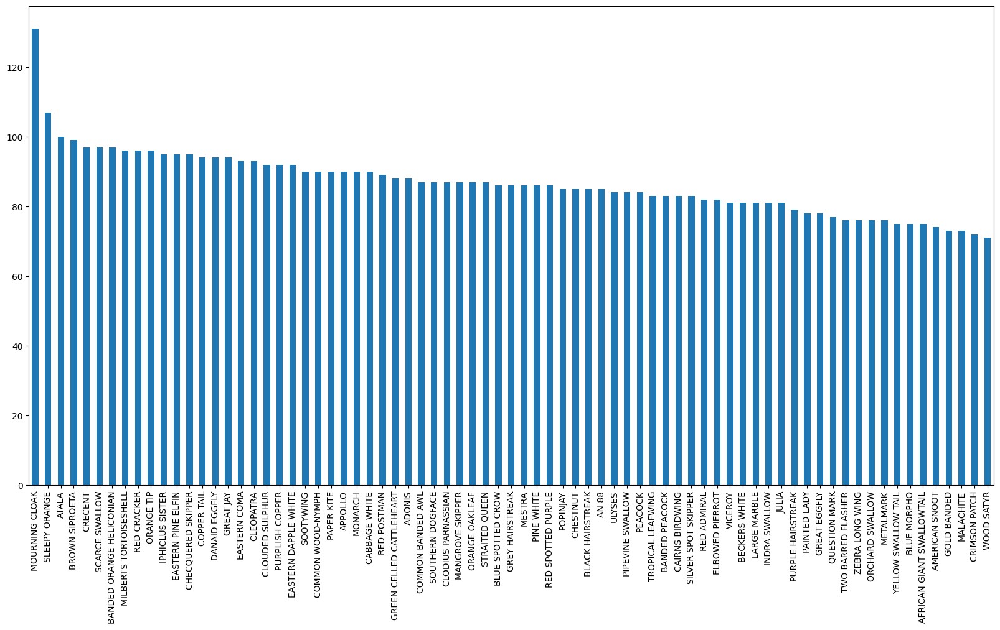

In [ ]:
train_csv['label'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
np.median(train_csv['label'].value_counts())

86.0

In [ ]:
len(train_csv['filename']), len(butterfly_train)

(6499, 6499)

## Preprocessing

### Split the data into validation and train

In [ ]:
def value_of_X():
  """
  X values
  """
  image_path = ['/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/train/'+ image for image in train_csv['filename']]
  return image_path

In [ ]:
X = value_of_X()
X[:4]

['/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/train/Image_1.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/train/Image_2.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/train/Image_3.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/train/Image_4.jpg']

In [ ]:
unique_values = np.unique(train_csv['label'])
unique_values, len(unique_values)

(array(['ADONIS', 'AFRICAN GIANT SWALLOWTAIL', 'AMERICAN SNOOT', 'AN 88',
        'APPOLLO', 'ATALA', 'BANDED ORANGE HELICONIAN', 'BANDED PEACOCK',
        'BECKERS WHITE', 'BLACK HAIRSTREAK', 'BLUE MORPHO',
        'BLUE SPOTTED CROW', 'BROWN SIPROETA', 'CABBAGE WHITE',
        'CAIRNS BIRDWING', 'CHECQUERED SKIPPER', 'CHESTNUT', 'CLEOPATRA',
        'CLODIUS PARNASSIAN', 'CLOUDED SULPHUR', 'COMMON BANDED AWL',
        'COMMON WOOD-NYMPH', 'COPPER TAIL', 'CRECENT', 'CRIMSON PATCH',
        'DANAID EGGFLY', 'EASTERN COMA', 'EASTERN DAPPLE WHITE',
        'EASTERN PINE ELFIN', 'ELBOWED PIERROT', 'GOLD BANDED',
        'GREAT EGGFLY', 'GREAT JAY', 'GREEN CELLED CATTLEHEART',
        'GREY HAIRSTREAK', 'INDRA SWALLOW', 'IPHICLUS SISTER', 'JULIA',
        'LARGE MARBLE', 'MALACHITE', 'MANGROVE SKIPPER', 'MESTRA',
        'METALMARK', 'MILBERTS TORTOISESHELL', 'MONARCH', 'MOURNING CLOAK',
        'ORANGE OAKLEAF', 'ORANGE TIP', 'ORCHARD SWALLOW', 'PAINTED LADY',
        'PAPER KITE', 'PEACO

In [ ]:
len(X)

6499

In [ ]:
len(train_csv['label'])

6499

In [ ]:
# find if the element at 100 is in unique_values
print(train_csv['label'][100])
train_csv['label'][100] == unique_values

BECKERS WHITE


array([False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# this code takes an element in the array of unique_values then compares it to the values of each element in the label column.
# for each value that is found the result is true
boolean_for_y = [label == unique_values for label in train_csv['label']]
len(boolean_for_y), boolean_for_y[:2]

(6499,
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,  True, False, False, False, False, False,
         False, False, False]),
  array([ True, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, Fa

In [ ]:
y = boolean_for_y

In [ ]:
len(X), len(y)

(6499, 6499)

In [ ]:
total_train_valid_images = len(butterfly_train)
total_train_valid_images

6499

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split (X[:total_train_valid_images],
                                                        y[:total_train_valid_images],
                                                        test_size=0.2,
                                                        random_state=42)
len(X_train), len(X_valid), len(y_train), len(y_valid)

(5199, 1300, 5199, 1300)

### Turn images into tensors

In [ ]:
IMG_SIZE = 224
def to_tensors_test(image_path, image_size=IMG_SIZE):
  """
  THIS WILL BE USED BY THE TEST DATASET
  1. turns the image to a format the computer understands
  2. decodes the image into 3 color channels
  3. change the dtype of the images to float32 to save on memory
  4. resizes the images to 224 by 224 to save on memory
  """
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=(IMG_SIZE, IMG_SIZE))
  return image


In [ ]:
def to_tensors_train_valid(image_path, label):
  """
  This will be used by train and valid dataset
  """
  image = to_tensors_test(image_path)
  return image, label

### Turn our images into 32 batches at a time

In [ ]:
BATCH_SIZE=32
def batching(X, y=None, valid_data=False, test_data=False, batch_size=BATCH_SIZE):
  """
  this function will batch the images in train, validation and test in batches of 32
  in iteration until all images are batched
  the batching process will include:
  A. turning the images and (labels) into tensorflow datasets
  B. map() through the dataset and batching the images into groups of 32
  """
  if test_data:
    print('processing test data....')
    image_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    image_batch = image_dataset.map(to_tensors_test).batch(BATCH_SIZE)
    return image_batch

  elif valid_data:
    print ('processing valid data...')
    image_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                        tf.constant(y)))
    image_batch = image_dataset.map(to_tensors_train_valid).batch(BATCH_SIZE)
    return image_batch

  else:
    print ('processing training data....')
    image_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                        tf.constant(y)))
    image_shuffle = image_dataset.shuffle(buffer_size=len(X))
    image_batch = image_shuffle.map(to_tensors_train_valid).batch(BATCH_SIZE)
    return image_batch

In [ ]:
tf.constant(y_train).shape

TensorShape([5199, 75])

In [ ]:
train_data = batching(X_train, y_train)
valid_data = batching(X_valid, y_valid, valid_data=True)
train_data, valid_data

processing training data....
processing valid data...


(<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 75), dtype=tf.bool, name=None))>,
 <_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 75), dtype=tf.bool, name=None))>)

In [ ]:
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 75), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 75), dtype=tf.bool, name=None)))

### Visualize the batches with images

In [ ]:
X_images, y_labels = next(batching(X_train, y_train).as_numpy_iterator())
X_images, y_labels

processing training data....


(array([[[[0.3137255 , 0.38823533, 0.13725491],
          [0.30588236, 0.3803922 , 0.12156864],
          [0.30980393, 0.37254903, 0.11764707],
          ...,
          [0.34901962, 0.38431376, 0.20784315],
          [0.34117648, 0.37647063, 0.20784315],
          [0.3372549 , 0.37254903, 0.20392159]],
 
         [[0.32941177, 0.4039216 , 0.15294118],
          [0.32156864, 0.39607847, 0.13725491],
          [0.3254902 , 0.38823533, 0.13333334],
          ...,
          [0.33333334, 0.36862746, 0.19215688],
          [0.3254902 , 0.36078432, 0.19215688],
          [0.3254902 , 0.36078432, 0.19215688]],
 
         [[0.34901962, 0.41176474, 0.16470589],
          [0.34117648, 0.4039216 , 0.14901961],
          [0.34117648, 0.4039216 , 0.14901961],
          ...,
          [0.3137255 , 0.34901962, 0.18039216],
          [0.30588236, 0.34117648, 0.17254902],
          [0.30588236, 0.34117648, 0.17254902]],
 
         ...,
 
         [[0.6862745 , 0.46274513, 0.0509804 ],
          [0.73725

In [ ]:
np.argmax(X_images[2])

0

In [ ]:
y_labels[2]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
unique_values[y_labels[2]]

array(['DANAID EGGFLY'], dtype=object)

In [ ]:
def visualize_first_25(images, labels):
  """
  function for visualizing the images to labels
  """
  plt.figure(figsize=(15,10))
  for i in range (25):
    plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_values[labels[i]])
    plt.axis('off')

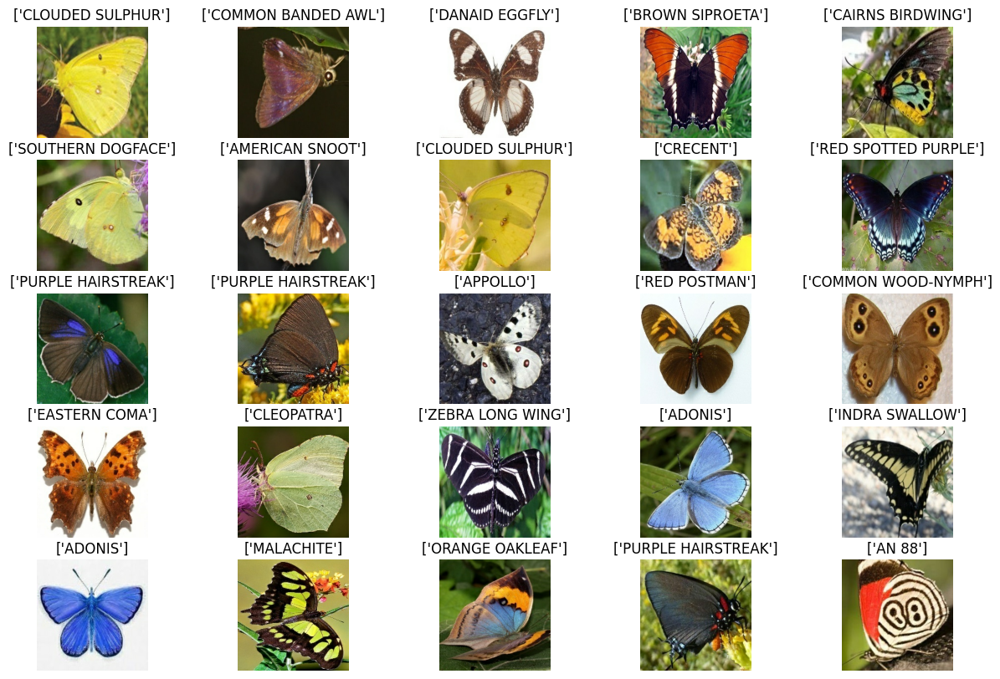

In [ ]:
visualize_first_25(X_images, y_labels)

##Building a Model

### INPUT_SHAPE
### OUTPUT_SHAPE
### MODEL_URL

In [ ]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_values)
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

In [ ]:
import tensorflow_hub as hub
def butterfly_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url=MODEL_URL):
  """

  """
  model = tf.keras.Sequential([
     hub.KerasLayer(MODEL_URL),
     tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation = 'softmax')
     ])
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['Accuracy']
  )
  model.build(INPUT_SHAPE)
  return model

## Two call backs to monitor the models performance

### 1.) tensorboard callback

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime
def tensor_board():
  """
  """
  logdir = os.path.join('/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/logs/',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

## 2.) early stopping callback

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_Accuracy',
                                                  patience = 3)

## Train the model

In [ ]:
EPOCHS = 100

In [ ]:
def train_model():
  model = butterfly_model()

  tensorboard = tensor_board()

  model.fit(x=train_data,
            epochs = EPOCHS,
            validation_data = valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Epoch 1/100
163/163 [==============================] - 193s 1s/step - loss: 1.6350 - Accuracy: 0.6294 - val_loss: 0.7804 - val_Accuracy: 0.7962
Epoch 2/100
163/163 [==============================] - 19s 116ms/step - loss: 0.4814 - Accuracy: 0.8815 - val_loss: 0.5793 - val_Accuracy: 0.8400
Epoch 3/100
163/163 [==============================] - 16s 97ms/step - loss: 0.2912 - Accuracy: 0.9371 - val_loss: 0.5184 - val_Accuracy: 0.8508
Epoch 4/100
163/163 [==============================] - 14s 87ms/step - loss: 0.2024 - Accuracy: 0.9596 - val_loss: 0.4637 - val_Accuracy: 0.8700


## Visualize the model training

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly\ Identification/logs

Reusing TensorBoard on port 6006 (pid 10808), started 4:52:51 ago. (Use '!kill 10808' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
predictions = train_model().predict(valid_data, verbose=1)
predictions

Epoch 1/100
163/163 [==============================] - 27s 134ms/step - loss: 1.6462 - Accuracy: 0.6184 - val_loss: 0.7359 - val_Accuracy: 0.8062
Epoch 2/100
163/163 [==============================] - 14s 86ms/step - loss: 0.4786 - Accuracy: 0.8857 - val_loss: 0.5688 - val_Accuracy: 0.8531
Epoch 3/100
163/163 [==============================] - 19s 114ms/step - loss: 0.2924 - Accuracy: 0.9329 - val_loss: 0.5018 - val_Accuracy: 0.8692
Epoch 4/100
41/41 [==============================] - 3s 57ms/step


array([[2.78508612e-08, 2.44439389e-06, 2.59112176e-09, ...,
        1.33433332e-07, 5.97551832e-07, 3.90143941e-06],
       [1.30942062e-05, 1.71854976e-04, 1.07539679e-04, ...,
        3.02679109e-05, 8.57997045e-04, 3.66562199e-05],
       [1.43767193e-06, 5.80371998e-05, 3.64034463e-06, ...,
        1.95131429e-06, 9.84598682e-06, 2.99522821e-06],
       ...,
       [5.07351160e-07, 5.82663375e-08, 1.06431958e-06, ...,
        8.88291254e-08, 3.08756262e-06, 5.26575263e-08],
       [1.07868706e-04, 1.94479640e-06, 1.58611321e-04, ...,
        2.01143466e-05, 2.00575141e-05, 1.57066261e-05],
       [6.53607742e-07, 3.14057871e-07, 7.02968634e-08, ...,
        3.22627102e-06, 3.77752116e-07, 5.46348110e-06]], dtype=float32)

### turn array of prediction into a label

In [ ]:
def prediction_to_label(predictions_probabiliites):
  """
  """
  label = unique_values[np.argmax(predictions_probabiliites)]
  return label

In [ ]:
pred_label = prediction_to_label(predictions[100])
pred_label

'PEACOCK'

### Unbatch the validation data

In [ ]:
def unbatch_validation_data(data):
  """
  Unbatch the validation data for valid data
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_values[np.argmax(label)])
  return images, labels

In [ ]:
unbatch_validation_data(valid_data)

([array([[[0.9294118 , 0.9294118 , 0.9294118 ],
          [0.9333334 , 0.9333334 , 0.9333334 ],
          [0.9333334 , 0.9333334 , 0.94117653],
          ...,
          [0.8862746 , 0.89019614, 0.9058824 ],
          [0.87843144, 0.882353  , 0.8980393 ],
          [0.8745099 , 0.87843144, 0.8941177 ]],
  
         [[0.9333334 , 0.9333334 , 0.9333334 ],
          [0.9333334 , 0.9333334 , 0.9333334 ],
          [0.93725497, 0.93725497, 0.9450981 ],
          ...,
          [0.89019614, 0.8941177 , 0.909804  ],
          [0.882353  , 0.8862746 , 0.90196085],
          [0.87843144, 0.882353  , 0.8980393 ]],
  
         [[0.94117653, 0.94117653, 0.94117653],
          [0.94117653, 0.94117653, 0.94117653],
          [0.94117653, 0.94117653, 0.9490197 ],
          ...,
          [0.8941177 , 0.8980393 , 0.91372555],
          [0.8862746 , 0.89019614, 0.9058824 ],
          [0.882353  , 0.8862746 , 0.90196085]],
  
         ...,
  
         [[0.9215687 , 0.9215687 , 0.9215687 ],
          [0.9

In [ ]:
valid_image, valid_label = unbatch_validation_data(valid_data)
valid_image[0], valid_label[0]

(array([[[0.9294118 , 0.9294118 , 0.9294118 ],
         [0.9333334 , 0.9333334 , 0.9333334 ],
         [0.9333334 , 0.9333334 , 0.94117653],
         ...,
         [0.8862746 , 0.89019614, 0.9058824 ],
         [0.87843144, 0.882353  , 0.8980393 ],
         [0.8745099 , 0.87843144, 0.8941177 ]],
 
        [[0.9333334 , 0.9333334 , 0.9333334 ],
         [0.9333334 , 0.9333334 , 0.9333334 ],
         [0.93725497, 0.93725497, 0.9450981 ],
         ...,
         [0.89019614, 0.8941177 , 0.909804  ],
         [0.882353  , 0.8862746 , 0.90196085],
         [0.87843144, 0.882353  , 0.8980393 ]],
 
        [[0.94117653, 0.94117653, 0.94117653],
         [0.94117653, 0.94117653, 0.94117653],
         [0.94117653, 0.94117653, 0.9490197 ],
         ...,
         [0.8941177 , 0.8980393 , 0.91372555],
         [0.8862746 , 0.89019614, 0.9058824 ],
         [0.882353  , 0.8862746 , 0.90196085]],
 
        ...,
 
        [[0.9215687 , 0.9215687 , 0.9215687 ],
         [0.9215687 , 0.9215687 , 0.92156

### Visualize

In [ ]:
def graph_visual(prediction, valid_labels, n=1):
  """
  graph for the top 5 predictions
  """
  prob_pred, truth_label = prediction[n], valid_labels[n]

  # prob_pred_to_label = prediction_to_label(prob_pred)

  top_five = prob_pred.argsort()[-5:][::-1]
  top_five_prob = prob_pred [top_five]
  top_five_tolabel = unique_values[top_five]


  plot_graph = plt.bar(np.arange(len(top_five_tolabel)),
                       top_five_prob,
                       color='grey')
  plt.xticks(np.arange(len(top_five_tolabel)),
             labels=top_five_tolabel,
             rotation='vertical')

  if np.isin(truth_label, top_five_tolabel):
    plot_graph[np.argmax(top_five_tolabel==truth_label)].set_color('green') #np.argmax(top_five_tolabel==truth_label) converts the labels to integers
  else:
    pass

In [ ]:
prediction_to_label(predictions[1000])

'CHECQUERED SKIPPER'

In [ ]:
top_five = predictions[1000].argsort()[-5:][::-1]
top_five

array([15,  2, 23, 22, 56])

In [ ]:
predictions_to_labels = unique_values[top_five]
predictions_to_labels

array(['CHECQUERED SKIPPER', 'AMERICAN SNOOT', 'CRECENT', 'COPPER TAIL',
       'PURPLISH COPPER'], dtype=object)

In [ ]:
np.arange(len(predictions_to_labels))

array([0, 1, 2, 3, 4])

In [ ]:
 probabilities_top_five = predictions[top_five]
 probabilities_top_five[0]

array([4.80357301e-07, 1.12123133e-04, 1.55961989e-05, 1.26771120e-04,
       3.40911953e-07, 3.72032332e-07, 7.69615889e-01, 6.37942605e-07,
       1.68126735e-05, 3.38864652e-07, 1.88993101e-04, 4.33327330e-07,
       1.56460756e-05, 1.14655840e-07, 7.61225674e-05, 6.31152943e-05,
       2.62311223e-04, 5.34349192e-06, 1.66941536e-05, 1.62259812e-06,
       2.64905120e-05, 1.31830584e-05, 2.20562447e-06, 3.17646118e-05,
       6.37120029e-05, 9.04300468e-05, 1.31017732e-04, 7.01398690e-08,
       2.38887878e-07, 2.06814684e-06, 1.43194469e-04, 3.58851648e-05,
       1.96525274e-04, 8.34771683e-08, 2.46551899e-05, 3.16793921e-05,
       2.08738633e-03, 2.95649297e-05, 1.17630225e-05, 4.51353437e-04,
       3.95011921e-06, 6.23061368e-03, 1.81841810e-04, 5.87256625e-04,
       1.49616790e-06, 6.02746732e-05, 4.99841641e-04, 1.42804303e-04,
       1.43130863e-04, 6.69171204e-05, 1.84891251e-05, 1.63895357e-03,
       1.32356843e-06, 1.76997619e-05, 6.19427228e-05, 1.15046169e-04,
      

In [ ]:
np.arange(len(prediction_to_label(predictions[1000])))

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17])

In [ ]:
np.arange(len(prediction_to_label(predictions[6])))

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17])

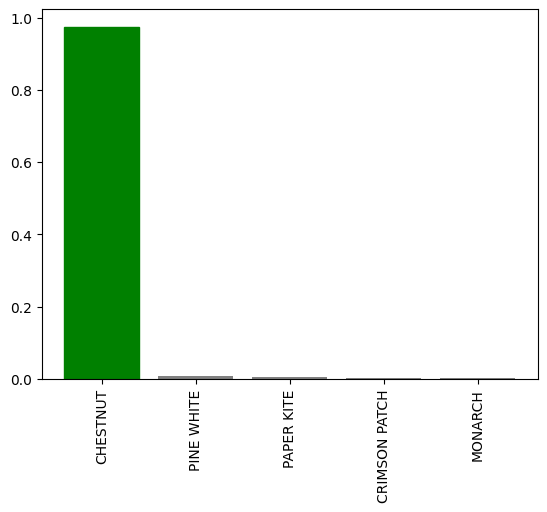

In [ ]:
graph_visual(prediction = predictions,
             valid_labels = valid_label,
             n=1200)

In [ ]:
def pic_visual(prediction, valid_labels, image, n=1):
  """
  visual graph for image
  """
  pred_prob, truth_label, images = prediction[n], valid_labels[n], image[n]

  to_label = prediction_to_label(pred_prob)

  plt.imshow(images)
  plt.xticks([])
  plt.yticks([])

  if to_label == truth_label:
    color = 'green'
  else:
    color = 'red'

  plt.title('{}{:2.0f}%{}.'.format(to_label,
                                   np.max(pred_prob)*100,
            truth_label),
            color=color)

In [ ]:
np.max(predictions[1000])*100

93.87287497520447

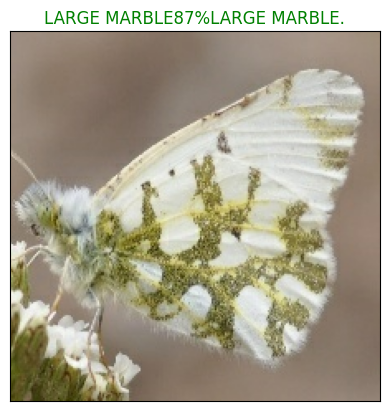

In [ ]:
pic_visual(prediction = predictions,
           valid_labels = valid_label,
           image = valid_image,
           n=501)

## combine graph & picture

<function matplotlib.pyplot.show(close=None, block=None)>

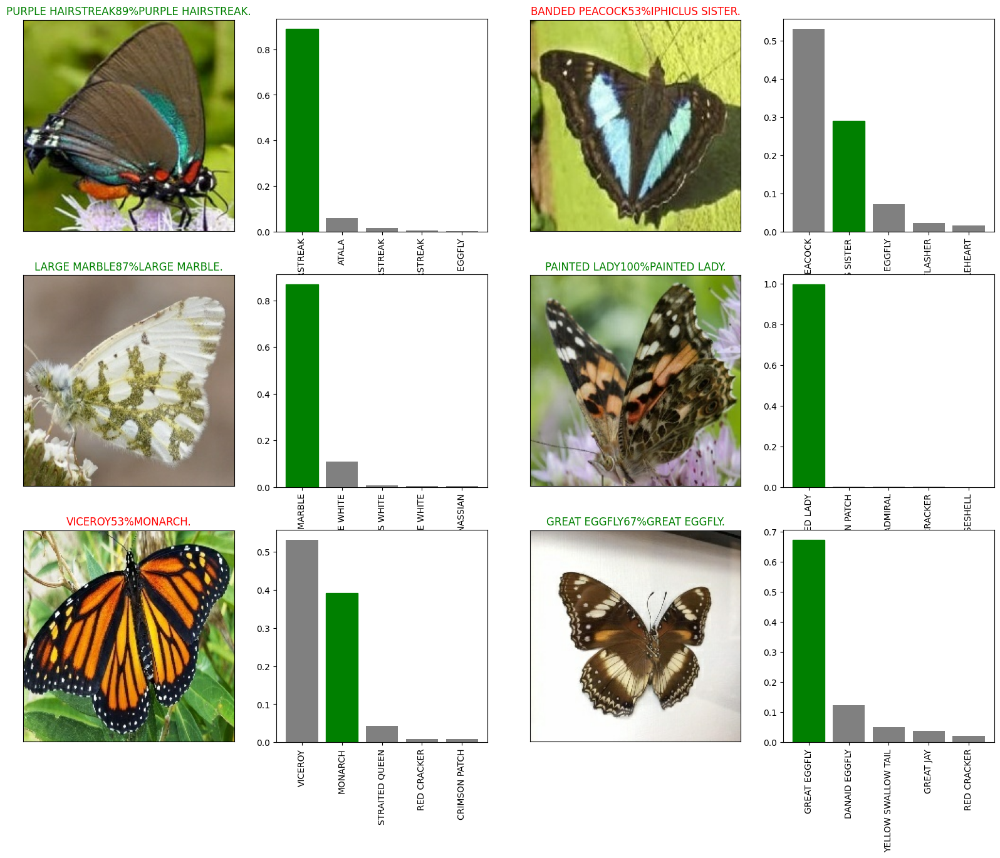

In [ ]:
i_addition = 499
nrows = 3
ncols = 2
num_images = nrows * ncols
plt.figure(figsize=(10*ncols, 5*nrows))#*
for i in range(num_images):
  plt.subplot(nrows, 2*ncols, 2*i+1)
  pic_visual(prediction=predictions,
             valid_labels = valid_label,
             image = valid_image,
             n=i+i_addition)
  plt.subplot(nrows, 2*ncols, 2*i+2)
  graph_visual(prediction = predictions,
             valid_labels = valid_label,
             n=i+i_addition)
plt.show

## Save and reload the trained model

### Save the trained model

In [ ]:
def save_trained_model(model, suffix=None):
  """
  """
  log_dir = os.path.join('/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/trained_model',
                      datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path = log_dir + '-' + suffix + '.h5'
  print ('saving model...', model_path)
  model.save(log_dir)
  return model_path

### load the saved model

In [ ]:
def load_saved_model(model_path):
  """
  """
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [ ]:
save_trained_model(model, '6499-images-mobilenetv2-adam')

saving model... /content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/trained_model/20231011-094256-6499-images-mobilenetv2-adam.h5


'/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/trained_model/20231011-094256-6499-images-mobilenetv2-adam.h5'

In [ ]:
loaded_model = load_saved_model('/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/trained_model/20231011-090408')
loaded_model

In [ ]:
loaded_model.evaluate(valid_data)

41/41 [==============================] - 3s 55ms/step - loss: 0.4637 - Accuracy: 0.8700


[0.4636865258216858, 0.8700000047683716]

In [ ]:
model.evaluate(valid_data)

41/41 [==============================] - 3s 77ms/step - loss: 0.4637 - Accuracy: 0.8700


[0.4636865258216858, 0.8700000047683716]

In [ ]:
train_model().evaluate(valid_data)

Epoch 1/100
163/163 [==============================] - 23s 107ms/step - loss: 1.6689 - Accuracy: 0.6253 - val_loss: 0.7736 - val_Accuracy: 0.7977
Epoch 2/100
163/163 [==============================] - 14s 83ms/step - loss: 0.4793 - Accuracy: 0.8859 - val_loss: 0.5594 - val_Accuracy: 0.8492
Epoch 3/100
163/163 [==============================] - 13s 77ms/step - loss: 0.2948 - Accuracy: 0.9334 - val_loss: 0.5199 - val_Accuracy: 0.8515
Epoch 4/100
41/41 [==============================] - 2s 55ms/step - loss: 0.4783 - Accuracy: 0.8662


[0.47832706570625305, 0.8661538362503052]

##Make predictions on the testdata

In [ ]:
Test_Data = pd.read_csv('/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/Testing_set.csv', index_col=False)
Test_Data


,filename
0,Image_1.jpg
1,Image_2.jpg
2,Image_3.jpg
3,Image_4.jpg
4,Image_5.jpg
...,...
2781,Image_2782.jpg
2782,Image_2783.jpg
2783,Image_2784.jpg
2784,Image_2785.jpg


In [ ]:
Test_Data.shape

(2786, 1)

In [ ]:
test_images = os.listdir('/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test')
test_images[:5]

['Image_2383.jpg',
 'Image_2205.jpg',
 'Image_2216.jpg',
 'Image_2589.jpg',
 'Image_2391.jpg']

In [ ]:
Test_Data == len(test_images)

True

In [ ]:
Test_Data = len(Test_Data)
Test_Data

2786

In [ ]:
custom_url = ['/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/' + fname for fname in os.listdir('/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test')]
custom_url

['/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/Image_2383.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/Image_2205.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/Image_2216.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/Image_2589.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/Image_2391.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/Image_234.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/Image_2449.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/Image_2528.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/Image_2424.jpg',
 '/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/test/Image_2783.jpg',
 '/content/drive/MyDrive/Butter

In [ ]:
test = batching(custom_url, test_data=True)
test

processing test data....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_preds = train_model().predict(test)
test_preds

Epoch 1/100
163/163 [==============================] - 18s 88ms/step - loss: 1.6779 - Accuracy: 0.6222 - val_loss: 0.7793 - val_Accuracy: 0.8138
Epoch 2/100
163/163 [==============================] - 14s 87ms/step - loss: 0.4753 - Accuracy: 0.8902 - val_loss: 0.5698 - val_Accuracy: 0.8492
Epoch 3/100
163/163 [==============================] - 13s 81ms/step - loss: 0.2973 - Accuracy: 0.9354 - val_loss: 0.5081 - val_Accuracy: 0.8662
Epoch 4/100
88/88 [==============================] - 66s 495ms/step


array([[4.3670035e-08, 1.4299578e-08, 2.3784507e-06, ..., 4.7825179e-06,
        1.5887481e-07, 3.5659784e-08],
       [4.2619471e-05, 6.9633890e-05, 1.6165795e-03, ..., 2.1772374e-01,
        4.1229911e-03, 2.2729833e-04],
       [1.8925267e-07, 2.9517309e-09, 1.5849364e-06, ..., 3.3338850e-08,
        7.8511349e-08, 1.3329012e-08],
       ...,
       [9.8836003e-04, 4.6902010e-06, 2.2862674e-05, ..., 5.5424374e-04,
        1.9109193e-06, 5.2956227e-07],
       [3.0800134e-06, 8.9119872e-05, 9.2836031e-05, ..., 1.4829122e-05,
        1.5753027e-06, 8.5637924e-07],
       [2.5830854e-04, 6.8850590e-05, 1.6303953e-03, ..., 1.2351961e-04,
        2.0325264e-04, 5.9926515e-05]], dtype=float32)

In [ ]:
len(test_preds)

2786

In [ ]:
test_preds.shape

(2786, 75)

In [ ]:
test_preds

array([[4.3670035e-08, 1.4299578e-08, 2.3784507e-06, ..., 4.7825179e-06,
        1.5887481e-07, 3.5659784e-08],
       [4.2619471e-05, 6.9633890e-05, 1.6165795e-03, ..., 2.1772374e-01,
        4.1229911e-03, 2.2729833e-04],
       [1.8925267e-07, 2.9517309e-09, 1.5849364e-06, ..., 3.3338850e-08,
        7.8511349e-08, 1.3329012e-08],
       ...,
       [9.8836003e-04, 4.6902010e-06, 2.2862674e-05, ..., 5.5424374e-04,
        1.9109193e-06, 5.2956227e-07],
       [3.0800134e-06, 8.9119872e-05, 9.2836031e-05, ..., 1.4829122e-05,
        1.5753027e-06, 8.5637924e-07],
       [2.5830854e-04, 6.8850590e-05, 1.6303953e-03, ..., 1.2351961e-04,
        2.0325264e-04, 5.9926515e-05]], dtype=float32)

In [ ]:
test_to_label = prediction_to_label(test_preds[:2])
test_to_label

'SOUTHERN DOGFACE'

In [ ]:
test_to_label = [prediction_to_label(test_preds[i]) for i in range(len(test_preds))]
test_to_label

['SOUTHERN DOGFACE',
 'COMMON WOOD-NYMPH',
 'CABBAGE WHITE',
 'TWO BARRED FLASHER',
 'SCARCE SWALLOW',
 'GOLD BANDED',
 'DANAID EGGFLY',
 'SLEEPY ORANGE',
 'AN 88',
 'COMMON WOOD-NYMPH',
 'SOOTYWING',
 'LARGE MARBLE',
 'PURPLISH COPPER',
 'EASTERN COMA',
 'MONARCH',
 'CHECQUERED SKIPPER',
 'MESTRA',
 'MONARCH',
 'RED ADMIRAL',
 'VICEROY',
 'RED SPOTTED PURPLE',
 'GREAT EGGFLY',
 'BROWN SIPROETA',
 'APPOLLO',
 'PINE WHITE',
 'PEACOCK',
 'BANDED ORANGE HELICONIAN',
 'PURPLISH COPPER',
 'AN 88',
 'IPHICLUS SISTER',
 'MILBERTS TORTOISESHELL',
 'CAIRNS BIRDWING',
 'BROWN SIPROETA',
 'PINE WHITE',
 'COMMON WOOD-NYMPH',
 'ATALA',
 'MANGROVE SKIPPER',
 'TROPICAL LEAFWING',
 'MALACHITE',
 'EASTERN COMA',
 'CLOUDED SULPHUR',
 'DANAID EGGFLY',
 'RED ADMIRAL',
 'EASTERN COMA',
 'SOOTYWING',
 'CRECENT',
 'SCARCE SWALLOW',
 'BROWN SIPROETA',
 'CHESTNUT',
 'PURPLISH COPPER',
 'CHESTNUT',
 'BANDED ORANGE HELICONIAN',
 'EASTERN PINE ELFIN',
 'BECKERS WHITE',
 'BLUE MORPHO',
 'CRECENT',
 'MANGROVE SKIPP

In [ ]:
Test_Data

,filename
0,Image_1.jpg
1,Image_2.jpg
2,Image_3.jpg
3,Image_4.jpg
4,Image_5.jpg
...,...
2781,Image_2782.jpg
2782,Image_2783.jpg
2783,Image_2784.jpg
2784,Image_2785.jpg


In [ ]:
Test_Data.dtypes

filename    object
dtype: object

In [ ]:
np.array(Test_Data)
Test_Data

,filename
0,Image_1.jpg
1,Image_2.jpg
2,Image_3.jpg
3,Image_4.jpg
4,Image_5.jpg
...,...
2781,Image_2782.jpg
2782,Image_2783.jpg
2783,Image_2784.jpg
2784,Image_2785.jpg


In [ ]:
Test_Data_to_array = np.array(Test_Data)
Test_Data_to_array

array([['Image_1.jpg'],
       ['Image_2.jpg'],
       ['Image_3.jpg'],
       ...,
       ['Image_2784.jpg'],
       ['Image_2785.jpg'],
       ['Image_2786.jpg']], dtype=object)

In [ ]:
flattened_Test_Data_to_array = [item for sublist in Test_Data_to_array for item in sublist]

to_dataframe = pd.DataFrame({'Test_csv': flattened_Test_Data_to_array, 'Test_preds': test_to_label})
to_dataframe

,Test_csv,Test_preds
0,Image_1.jpg,SOUTHERN DOGFACE
1,Image_2.jpg,COMMON WOOD-NYMPH
2,Image_3.jpg,CABBAGE WHITE
3,Image_4.jpg,TWO BARRED FLASHER
4,Image_5.jpg,SCARCE SWALLOW
...,...,...
2781,Image_2782.jpg,BANDED PEACOCK
2782,Image_2783.jpg,EASTERN COMA
2783,Image_2784.jpg,BLACK HAIRSTREAK
2784,Image_2785.jpg,QUESTION MARK


In [ ]:
len(flattened_Test_Data_to_array), len(test_to_label)

(2786, 2786)

##Saving predictions to .csv

In [ ]:
to_dataframe.to_csv('/content/drive/MyDrive/Butterfly-dataset-kaggle/Butterfly Identification/Butterfly_test_predictions.csv', index=False)